<a href="https://colab.research.google.com/github/bhugh/FrequencyFingerprint/blob/main/FFT_Display_%26_Summing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Frequency Fingerprint Calculator - for audio files


##Initialize everything
*This cell loads necessary modules - please run this at the very first. You shouldn't need to run it again during the session unless something goes very wrong.*

In [ ]:
### Code below straight from: https://importchris.medium.com/how-to-create-understand-mel-spectrograms-ff7634991056
#!pip install librosa
#!pip install numpy
#!pip install matplotlib
#!apt-get install rubberband-cli librubberband-dev libsndfile1-dev
!pip install mido
!pip install mpld3
!pip install scipy==1.11.3
!pip install pyrubberband
import librosa, librosa.display
import numpy as np
#import cupy as np
import matplotlib.pyplot as plt
import mido
%matplotlib inline


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
libsndfile1-dev is already the newest version (1.0.31-2ubuntu0.1).
The following NEW packages will be installed:
  librubberband-dev libsamplerate0-dev rubberband-cli
0 upgraded, 3 newly installed, 0 to remove and 49 not upgraded.
Need to get 277 kB of archives.
After this operation, 967 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/main amd64 libsamplerate0-dev amd64 0.2.2-1build1 [61.5 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 librubberband-dev amd64 2.0.0-2 [127 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 rubberband-cli amd64 2.0.0-2 [87.5 kB]
Fetched 277 kB in 1s (413 kB/s)
Selecting previously unselected package libsamplerate0-dev:amd64.
(Reading database ... 123629 files and directories currently installed.)
Preparing to unpack .../libsamplerate0-dev_0.2.2-1build1_amd64.deb ...
Unpacking libsamplerate0-

##Load Your File
Here is where you load the audio file to be processed.

In [ ]:
sample_file = "vibeace" #"brahms" #"vibeace"
signal, sr = librosa.load(librosa.util.example(sample_file, hq=True))
#signal = np.asarray(signal)

This cell draws a wave plot of the entire audio file.

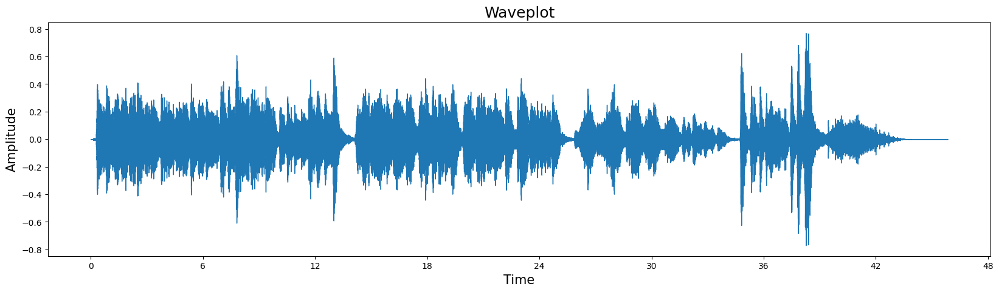

In [ ]:
plt.figure(figsize=(20, 5))
librosa.display.waveshow(signal, sr=sr)
plt.title('Waveplot', fontdict=dict(size=18))
plt.xlabel('Time', fontdict=dict(size=15))
plt.ylabel('Amplitude', fontdict=dict(size=15))
plt.show()

This cell provides a widget to play the audio file.

In [ ]:

import IPython.display as ipd
ipd.Audio(signal, rate=sr)

## Process File FFTs
Before running this cell, run cell "[Calc White Note Freqs](#scrollTo=MIDI_File_Frequency_Utils)" below.

In [ ]:
%matplotlib notebook
import time
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import numpy as np
#import cupy as np
from IPython.display import Audio, display, HTML
import subprocess # Import the subprocess module
import mpld3

#frames_persecond = 6.483572834
frames_persecond = 8

# Calculate audio duration
audio_duration = len(signal) / sr

# Create Audio widget
audio_widget = Audio(data=signal, rate=sr, autoplay=False)

# Display the Audio widget (it won't play automatically yet)
display(audio_widget)

fig, ax = plt.subplots() # Create a figure and an axes object
fig2, ax2 = plt.subplots()
ax.figure.set_size_inches(20, 5)
ax2.figure.set_size_inches(20, 5)

ax.set_xscale('log')
ax2.set_xscale('log')

ax.set_size_inches =(20, 5)
ax2.set_size_inches =(20, 5)

xticks, xlabels = calculate_white_note_frequencies()
ax.set_xticks(xticks, labels=xlabels)
ax2.set_xticks(xticks, labels=xlabels)

plt.title('Discrete-Fourier Transform', fontdict=dict(size=15))
plt.xlabel('Frequency', fontdict=dict(size=12))
plt.ylabel('Magnitude', fontdict=dict(size=12))

ax.set_xlim([28, 4200])  # Limit to positive frequencies
ax2.set_xlim([28, 4200])  # Limit to positive frequencies

max_y = 150
ax.set_ylim(0, max_y * 1.2)  # Add 10% buffer for better visualization
ax2.set_ylim(0, max_y * 1.2)  # Add 10% buffer for better visualization

line, = ax.plot([], [],color = 'green', zorder = 3) # Initialize an empty plot
line2, = ax.plot([], [],color = 'red', zorder = 2) # Initialize an empty plot
line3, = ax.plot([], [], color = 'orange', zorder = 1) # Initialize an empty plot

line1A, = ax2.plot([], [],color = 'green', zorder = 3) # Initialize an empty plot
line2A, = ax2.plot([], [],color = 'red', zorder = 2) # Initialize an empty plot
line3A, = ax2.plot([], [], color = 'orange', zorder = 1) # Initialize an empty plot




# Display the figure initially
#fig2.show(block=False)  # Non-blocking show to keep the figure open



chunks = round(audio_duration * frames_persecond) #2 per second
chunk_size = int(len(signal) / chunks)
print ("chunks" , chunks, chunk_size)

sum_fft = np.fft.fft(signal[0 : chunk_size] )
sum_fft = np.zeros_like(len(sum_fft))
fft_results = []
fft_mag_results = []
fft_frequencies_save = np.fft.fftfreq(100000, 1/sr)
#sum_magnitude = np.zeros_like(np.abs(sum_fft))
sum_magnitude = np.abs(sum_fft)
ani_count = 0

def animate(i):
  global sum_fft, sum_magnitude, fft_results, fft_mag_results, ani_count, max_y, fft_frequencies_save# Declare sum_fft as global to modify it within the function
  #print ("point", i)
  # Creating a Discrete-Fourier Transform with our FFT algorithm
  ani_count+=1
  print (".", end ="")
  if (i//60==i/60 and i>0):
    print ()
  s2 = signal[i * chunk_size : (i + 1) * chunk_size]
  s2_pad = np.pad(s2, (0, 16*len(s2)), 'constant',) # gives sharper peaks
  fast_fourier_transf = np.fft.fft(s2)
  fft_frequencies = np.fft.fftfreq(len(fast_fourier_transf), 1/sr)
  if (ani_count==1):
    fft_frequencies_save = fft_frequencies

  sum_fft = sum_fft + fast_fourier_transf/np.sqrt(chunks)
  # Magnitudes indicate the contribution of each frequency
  magnitude = np.abs(fast_fourier_transf)
  #sum_magnitude += magnitude
  #fft_results.append(magnitude)
  fft_mag_results.append(magnitude)
  fft_results.append(fast_fourier_transf)
  sum_magnitude = np.zeros_like(fft_mag_results[0])
  for mag in fft_mag_results:
    sum_magnitude += mag/ani_count
  #print (sum_magnitude)
  # mapping the magnitude to the relative frequency bins
  frequency = np.linspace(0, sr, len(magnitude))
  #frequency = np.linspace(0, sr, len(s2))
  # We only need the first half of the magnitude and frequency
  left_mag = magnitude[:int(len(magnitude)/2)]
  left_freq = frequency[:int(len(frequency)/2)]
  left_mag_forsum = sum_magnitude[:int(len(sum_magnitude)/2)]



  line.set_data(left_freq, left_mag) # Update the data for the plot
  #plt.plot(left_freq, left_mag

  line.set_data(left_freq, left_mag) # Update the data for the plot
  line1A.set_data(left_freq, left_mag) # Update the data for the plot

  #plt.plot(left_freq, left_mag)
  #print("Maxes:", np.max(left_mag), np.max(left_mag_forsum), ani_count, sum_magnitude == magnitude)
  line3.set_data(left_freq, left_mag_forsum*3) # Update the data for the plot
  line3A.set_data(left_freq, left_mag_forsum*3) # Update the data for the plot

  #plt.plot(left_freq, left_mag)
    # Magnitudes indicate the contribution of each frequency
  magnitude2 = np.abs(sum_fft)
  # mapping the magnitude to the relative frequency bins
  #frequency2 = np.linspace(0, sr, len(magnitude2))
  #frequency = np.linspace(0, sr, len(s2))
  # We only need the first half of the magnitude and frequency
  left_mag2 = magnitude2[:int(len(magnitude2)/2)]
  #left_freq2 = frequency2[:int(len(frequency2)/2)]

  max_y_old = max_y
  max_y = max(max_y, np.max(left_mag_forsum*3), np.max(left_mag2*3), np.max(left_mag)) #We X3 here just because it seems to make it scale better with the live graph
  if (max_y_old < max_y):
    ax.set_ylim(0, max_y)  # Add 10% buffer for better visualization
    ax2.set_ylim(0, max_y)  # Add 10% buffer for better visualization

  line2.set_data(left_freq, left_mag2*3)
  line2A.set_data(left_freq, left_mag2*3)

  # Display the plot for the current frame
  #plt.show()  # Update the plot
  #plt.pause(0.001)  # Pause to allow the plot to update

  #fig.canvas.draw()


  # Make a display graph every so often
  if ani_count//(frames_persecond*2) == -1000:

    ax2.add_line(line1A)
    ax2.add_line(line2A)
    ax2.add_line(line3A)


    #fig2.show( )
    html_fig2 = mpld3.fig_to_html(fig2)
    display(HTML(html_fig2))


  return line, line2, line3

print ("Processing", end="")
ani = animation.FuncAnimation(fig, animate, frames=chunks, interval=1000//frames_persecond, blit=True) # 1000ms = 1 second


ani.save('animation.mp4', writer='ffmpeg', fps=frames_persecond)  # Adjust fps as needed

print()
print ("Calculations complete - compiling MP3 video file . . .")

# Use FFmpeg to add audio
ffmpeg_command = [
    'ffmpeg',
    '-y',  # Overwrite output file if it exists
    '-i', 'animation.mp4',  # Input video file
    '-i', librosa.util.example(sample_file, hq=True),  # Input audio file (your audio)
    '-c:v', 'libx264',  # Re-encode using libx264
    '-pix_fmt', 'yuv420p',  # Common pixel format
    '-c:v', 'copy',  # Copy video codec
    '-c:a', 'aac',  # Choose audio codec (e.g., aac)
    '-strict', 'experimental',  # May be needed for some codecs
    '-r', str(frames_persecond),  # Set output frame rate to match input
    '/content/output_with_audio2.mp4'  # Output file name
]

subprocess.run(ffmpeg_command)

from IPython.display import HTML
from base64 import b64encode
mp4 = open('/content/output_with_audio2.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
html_code = f"""
<video width="1280" height="480" controls>
  <source src="{data_url}" type="video/mp4">
Your browser does not support the video tag.
</video>
"""
#display(HTML(html_code))

HTML(html_code)



#HTML(ani.to_html5_video())


#plt.show()




<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

chunks 367 2754
Processing..............................................................
............................................................
............................................................
............................................................
............................................................
............................................................
......
Calculations complete - compiling MP3 video file . . .


## Generate Frequency Fingerprint
*Before running this cell, run Process File FFTs (above) and Display Audio & Plots - utility functions (below).*

Note that this cell often has trouble running, and crashes, right after "Process File FFTs".  Usually just waiting a minute or two allows it to continue.

sum_FFT version (red)


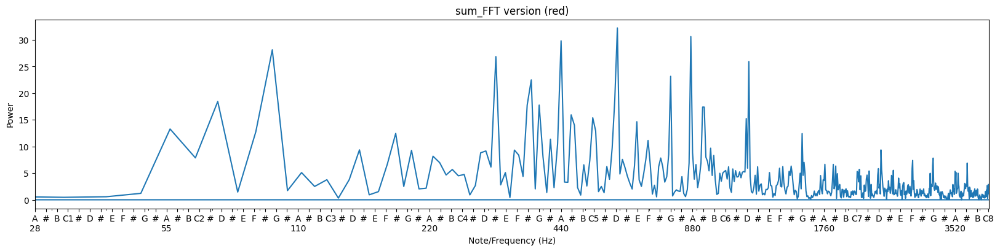

final_sum_FFT version 


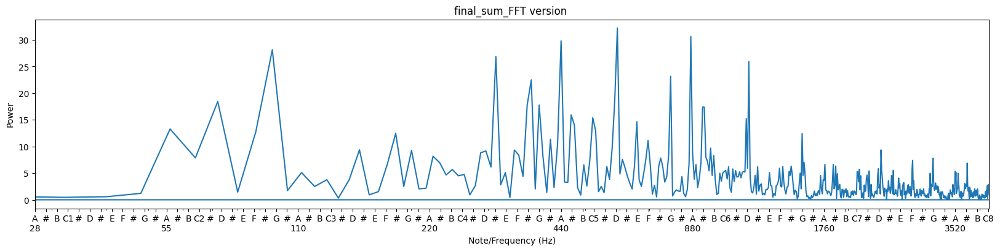

2754 [0.18581426 0.42817412 0.18080466 ... 0.59863752 0.18080466 0.42817412]
2754 [  0.           8.00653595  16.0130719  ... -24.01960784 -16.0130719
  -8.00653595]
Original FFT As Calculated


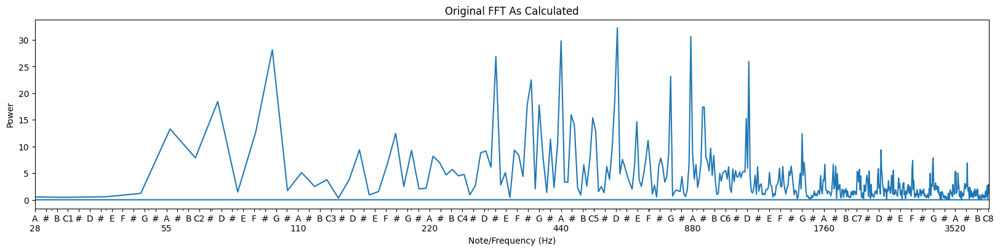

Original Amplitudes:  2754
Frequencies:  2754
FFT After Collecting to Piano Notes


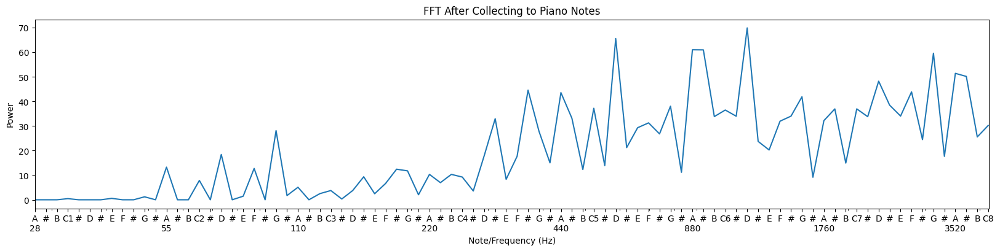

After filtering for piano only Amplitudes:  88
Frequencies:  88
FFT After Boosting Bass


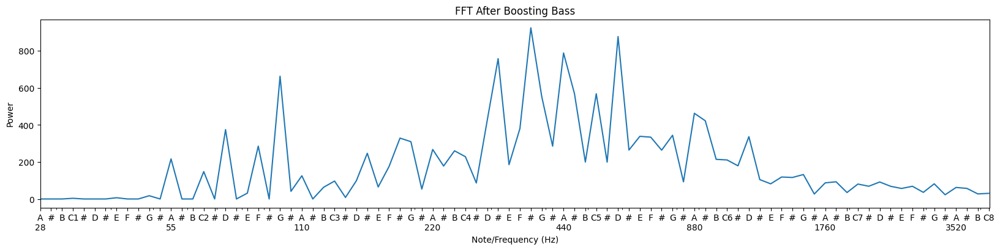

Generating signal...
SIGNL 132300 132300 1 (132300,) None


Now plotting original power curve after culling etc


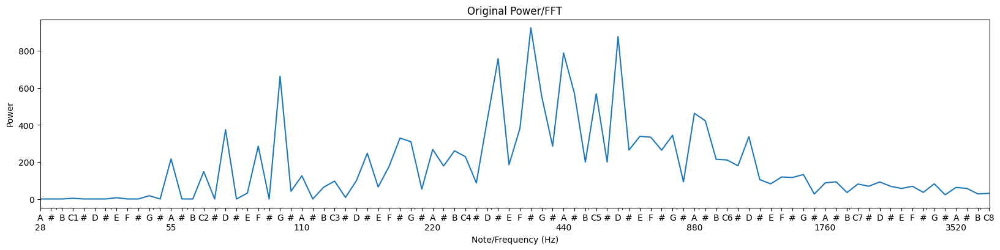

Now plotting derived FFT


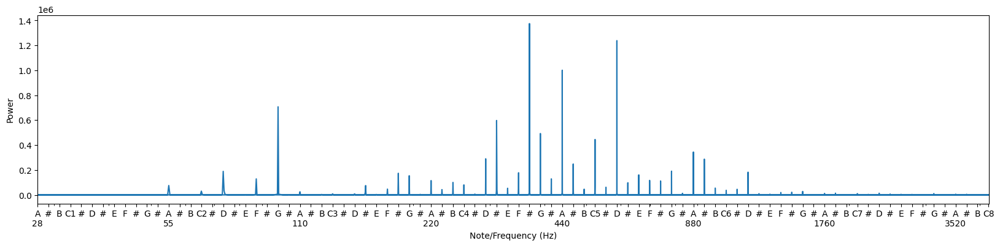

Now plotting the waveform


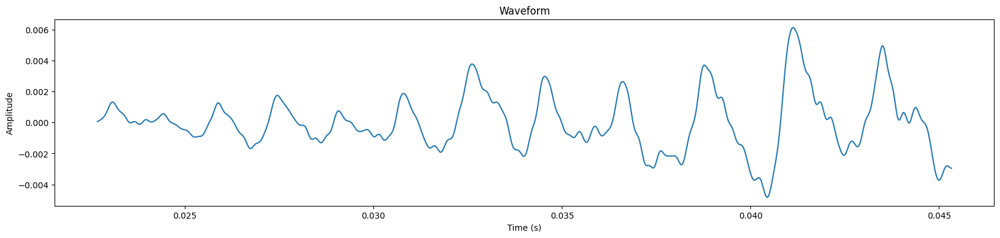

Now plotting the waveform


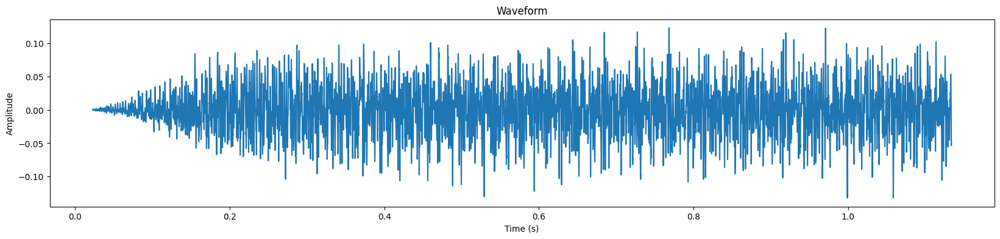

Now plotting the waveform


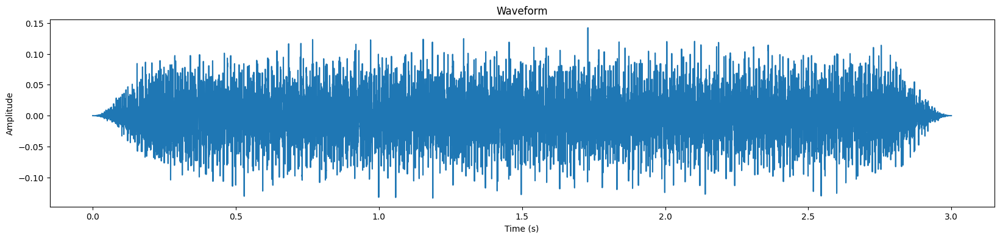

In [ ]:
import numpy as np
#import cupy as np

#plt.show(block=False)
%matplotlib inline
#plt.show(block=False)




final_sum_FFT = np.zeros_like(fft_mag_results[0])
for fft in fft_mag_results:
    final_sum_FFT += fft # We're not going to scale it here - that will happen later along the line while graphing...

final_sum_FFT = sum_fft

fft_mag_fromFFTSum = np.abs(final_sum_FFT)




reconstructed_signal = np.fft.ifft(final_sum_FFT)
display(Audio(data=np.real(reconstructed_signal), rate=sr))

# Convert the reconstructed signal to floating-point and normalize
reconstructed_signal = np.real(reconstructed_signal)  # Extract real part
reconstructed_signal = reconstructed_signal.astype(np.float32)  # Convert to float32
reconstructed_signal = librosa.util.normalize(reconstructed_signal) * 0.7 # Normalize to

fade_dur = 7/8/frames_persecond

reconstructed_signal = fade_in_out_audio (audio=reconstructed_signal, fade_duration=fade_dur)

display(Audio(data=np.real(reconstructed_signal), rate=sr, normalize=False))

# Calculate the desired stretch factor
stretch_factor = 5 / (1/8)  # 3 seconds / 0.125 seconds = 24

# Perform time stretching using phase vocoder
y_stretched = librosa.effects.time_stretch(reconstructed_signal, rate=1/stretch_factor, window="hamming")


y_stretched = high_pass_filter(y_stretched, sr, 20)
y_stretched = high_pass_filter(y_stretched, sr, 10)
y_stretched = high_pass_filter(y_stretched, sr, 5)

y_stretched = add_audio_with_offset(y_stretched/2, y_stretched/2, sr, 1/19)
##y_stretched = add_audio_with_offset(y_stretched/2, y_stretched/2, sr, 1/32)
y_stretched = add_audio_with_offset(y_stretched/2, y_stretched/2, sr, 1/8)
##y_stretched = add_audio_with_offset(y_stretched/2, y_stretched/2, sr, 3/10)

y_stretched = trim_and_fade(y_stretched, sr, 1, 1, 0.1, 0.1)


from scipy import signal

# Design notch filter
#b, a = signal.iirnotch(4.5, 100, sr)  # Center frequency 3.5Hz, quality factor 30


# Apply filter to stretched signal
#y_stretched = signal.lfilter(b, a, y_stretched)




display(Audio(data=np.real(y_stretched), rate=sr, normalize=False))

#import pyrubberband as rb
#didn't work well at all...
#y_stretched2 = rb.time_stretch(reconstructed_signal, sr, 1/stretch_factor,rbargs={'--crispness': 0.1})

#display(Audio(data=np.real(y_stretched2), rate=sr, normalize=False))

#fft_mag_fromFFTSum = fft_mag_fromFFTSum[:int(len(fft_mag_fromFFTSum)/2)]

#final_sum_frequency = np.linspace(0, sr, len(fft_mag_fromFFTSum))
final_sum_frequency = np.fft.fftfreq(len(fft_mag_fromFFTSum), 1/sr)

plot_amp_frq (final_sum_frequency,np.abs(sum_fft),"sum_FFT version (red)")
plot_amp_frq (final_sum_frequency,np.abs(final_sum_FFT),"final_sum_FFT version ")

#print ("FFT FREQUENCIES:")
#print (len(final_sum_frequency), len(fft_frequencies_save), final_sum_frequency==fft_frequencies_save)
#print (final_sum_frequency[0:15], fft_frequencies_save[0:15])

#final_sum_frequency = final_sum_frequency[:int(len(final_sum_frequency)/2)]

big_signal = []

"""

for filename in uploaded.keys():
    #print(filename)
    s=create_results(filename)
    #ret = ret1.copy()
    #s_max = np.max(np.abs(s))
    #print ("MAX ", s_max)
    #s = np.array([(s/ np.max(np.abs(s))) * 0.9]) #normalizing it slightly soft, .7
    big_signal.append(s)
    print ("SAVEM", len(big_signal), len (s), len(big_signal))
    #signal_list.append(s)
"""
print(len(fft_mag_fromFFTSum), fft_mag_fromFFTSum)
print(len(final_sum_frequency), final_sum_frequency)

display_audio_and_plots(frequencies=final_sum_frequency ,amplitudes=fft_mag_fromFFTSum,duration=3,sample_rate=44100)


#print ("=========================================+")
#print ("  ALL FREQUENCY FINGERPRINTS IN SEQUENCE")
#print ("=========================================+")
#print (len(big_signal[0]))
#sigs = np.concatenate(big_signal)
#audio36 = Audio(data=sigs, rate=sample_rate, normalize=False)
#display(audio36)



In [ ]:
##print (sum_magnitude)
#print (sum_fft)
#print (magnitude)
#print (line3)
print(fft_mag_results)


NameError: name 'fft_mag_results' is not defined

In [ ]:
#loads the current (last-produced) animation and plays it
from IPython.display import HTML
from base64 import b64encode
mp4 = open('/content/animation.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
html_code = f"""
<video width="1280" height="480" controls>
  <source src="{data_url}" type="video/mp4">
Your browser does not support the video tag.
</video>
"""
#display(HTML(html_code))

HTML(html_code)

In [ ]:
ipd.Audio(signal, rate=sr)

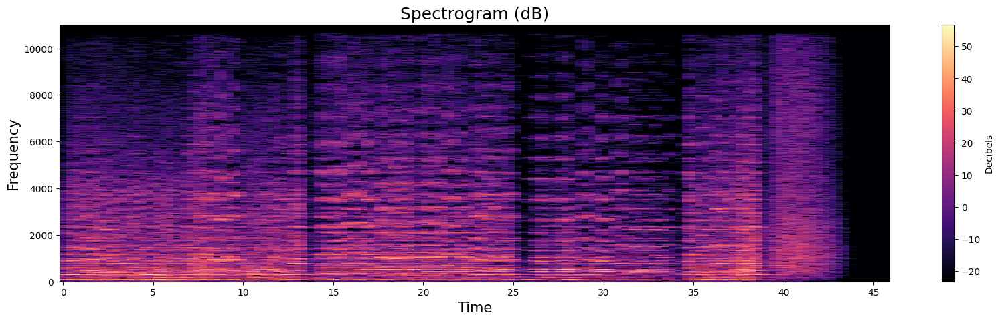

In [ ]:
# this is the number of samples in a window per fft
n_fft = 8*4096
# The amount of samples we are shifting after each fft
hop_length = 8*1024
# Short-time Fourier Transformation on our audio data
audio_stft = librosa.core.stft(signal, hop_length=hop_length, n_fft=n_fft)
# gathering the absolute values for all values in our audio_stft
spectrogram = np.abs(audio_stft)
# Converting the amplitude to decibels
log_spectro = librosa.amplitude_to_db(spectrogram)
# Plotting the short-time Fourier Transformation
plt.figure(figsize=(20, 5))
# Using librosa.display.specshow() to create our spectrogram
librosa.display.specshow(log_spectro, sr=sr, x_axis='time', y_axis='hz', hop_length=hop_length, cmap='magma')
plt.colorbar(label='Decibels')
plt.title('Spectrogram (dB)', fontdict=dict(size=18))
plt.xlabel('Time', fontdict=dict(size=15))
plt.ylabel('Frequency', fontdict=dict(size=15))
plt.show()

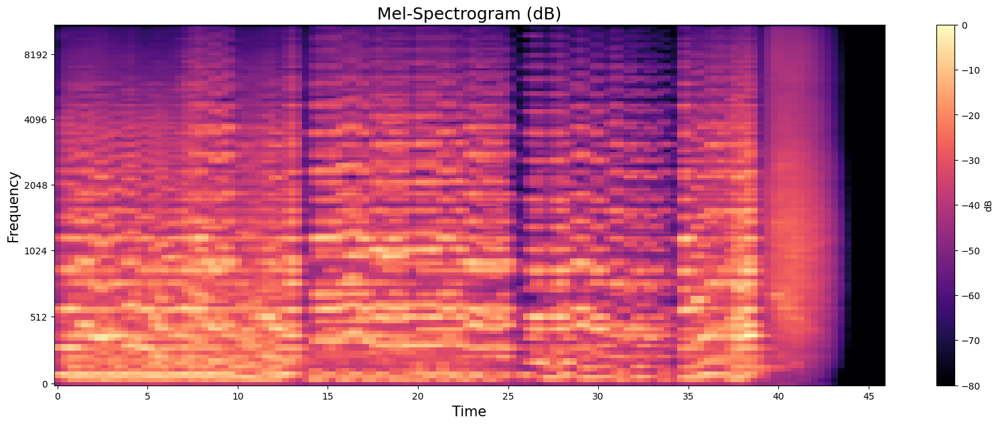

In [ ]:
mel_signal = librosa.feature.melspectrogram(y=signal, sr=sr, hop_length=hop_length,
 n_fft=n_fft)
spectrogram = np.abs(mel_signal)
power_to_db = librosa.power_to_db(spectrogram, ref=np.max)
plt.figure(figsize=(20, 7))
librosa.display.specshow(power_to_db, sr=sr, x_axis='time', y_axis='mel', cmap='magma',
 hop_length=hop_length)
plt.colorbar(label='dB')
plt.title('Mel-Spectrogram (dB)', fontdict=dict(size=18))
plt.xlabel('Time', fontdict=dict(size=15))
plt.ylabel('Frequency', fontdict=dict(size=15))
plt.show()

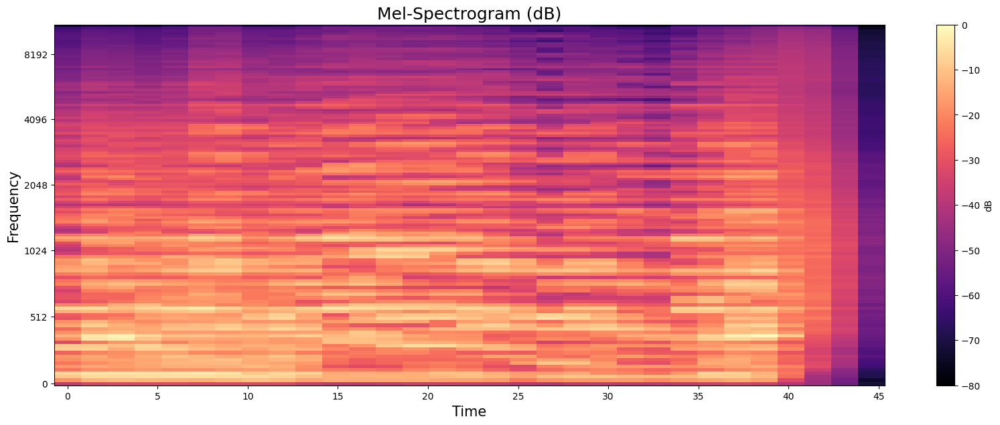

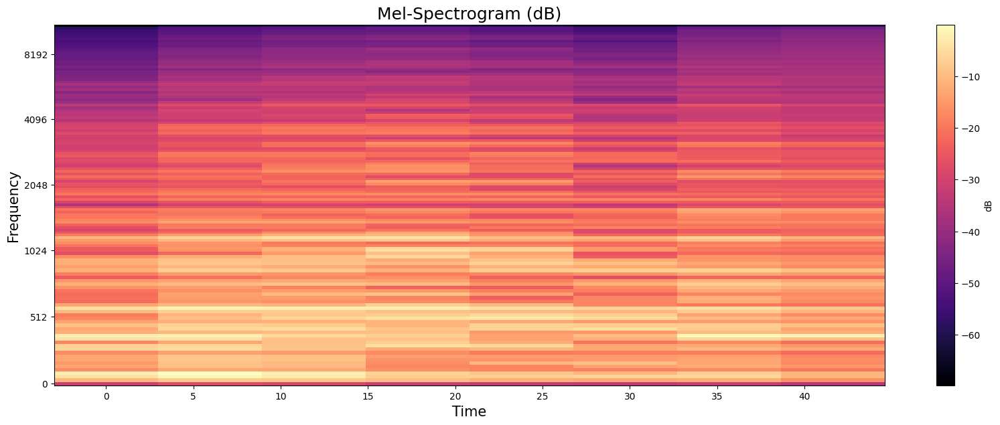

/usr/local/lib/python3.10/dist-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=2097152 is too large for input signal of length=1010880
  warnings.warn(


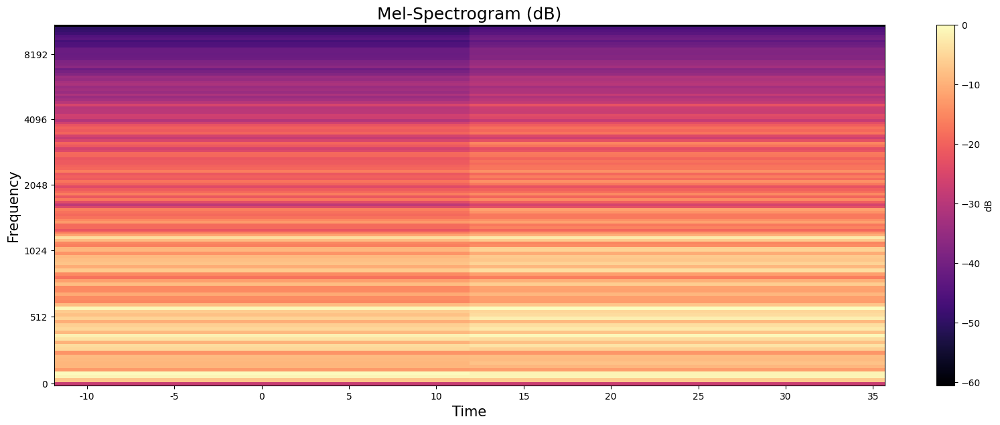

/usr/local/lib/python3.10/dist-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=8388608 is too large for input signal of length=1010880
  warnings.warn(


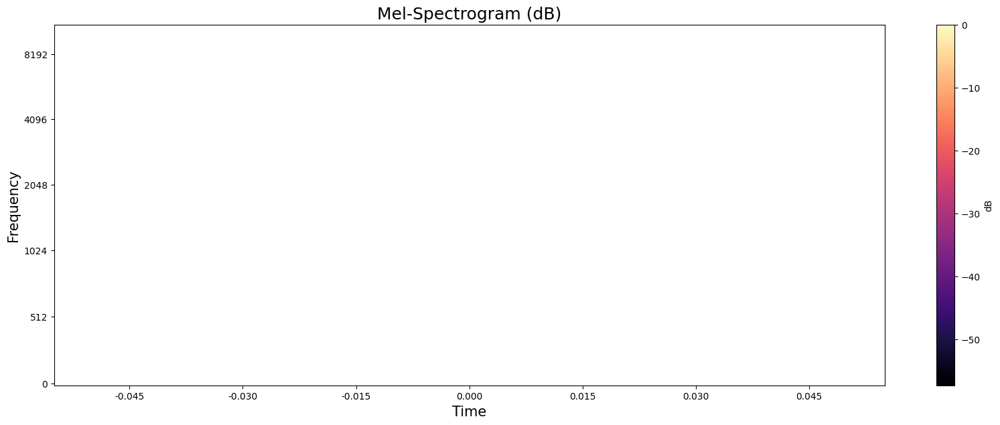

In [ ]:
for i in range(8,18,2):
  hop_length = 128*2**i
  n_fft = 4*hop_length
  mel_signal = librosa.feature.melspectrogram(y=signal, sr=sr, hop_length=hop_length,
  n_fft=n_fft)
  spectrogram = np.abs(mel_signal)
  power_to_db = librosa.power_to_db(spectrogram, ref=np.max)
  plt.figure(figsize=(20, 7))
  librosa.display.specshow(power_to_db, sr=sr, x_axis='time', y_axis='mel', cmap='magma',
  hop_length=hop_length)
  plt.colorbar(label='dB')
  plt.title('Mel-Spectrogram (dB)', fontdict=dict(size=18))
  plt.xlabel('Time', fontdict=dict(size=15))
  plt.ylabel('Frequency', fontdict=dict(size=15))
  plt.show()

###Calc White Note Freqs

In [ ]:
import numpy as np
#import cupy as np
from scipy.signal import find_peaks

def calculate_white_note_frequencies():

    # List to store note frequencies

    note_frequencies = []
    note_labels = []

    for f in range(21,109,1):
        note_freq = 440 * 2**((f-69)/12)
        note_name = midi_number_to_name(f)
        note_frequencies.append( note_freq)
        if note_name.find('#') <= 0:

            if (note_name.find('C') >= 0):
              note_name=note_name[0:2]
            else:
              note_name=note_name[0:1]
            if (note_name.find('A') >= 0):
                note_name += f"\n{note_freq:.0f}"
            note_labels.append(note_name)
        else:
          note_labels.append('#')
    #print (note_frequencies)
    #print (note_labels)

    return note_frequencies, note_labels

def midi_number_to_name(note_number, column = False):

    """Convert a MIDI note number to its corresponding note name."""

    # Define the note names and their corresponding MIDI numbers

    note_names = [

        'C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#', 'A', 'A#', 'B'

    ]
    note_names_column = [

        'C ', 'C#', 'D ', 'D#', 'E ', 'F ', 'F#', 'G ', 'G#', 'A ', 'A#', 'B '

    ]
    if (column):
        note_names = note_names_column

    # Calculate the octave and the note name

    octave = (note_number // 12) - 1 # MIDI note 0 is C-1

    note_name = note_names[round(note_number) % 12]

    return f"{note_name}{octave}"

import numpy as np

def calculate_piano_frequencies(start_note='A0', end_note='C8'):
    """Calculates frequencies for piano notes within a specified range.

    Args:
        start_note (str, optional): Starting note (e.g., 'A0'). Defaults to 'A0'.
        end_note (str, optional): Ending note (e.g., 'C8'). Defaults to 'C8'.

    Returns:
        numpy.ndarray: Array of frequencies corresponding to piano notes.
    """

    # Define note names and their corresponding MIDI numbers
    note_names = ['A', 'A#', 'B', 'C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#']
    note_names = 8*note_names
    #print (note_names)
    midi_numbers = range(21, 109)  # A0 to C8

    note_frequencies = {}
    for note, midi_num in zip(note_names, midi_numbers):
        frequency = 440 * (2 ** ((midi_num - 69) / 12))  # A4 is 440 Hz
        note_frequencies[note + str(midi_num // 12 - 1)] = frequency
        #print (note + str(midi_num // 12 - 1), frequency)
    #print (note_frequencies)
    start_midi = list(note_frequencies.keys()).index(start_note)
    end_midi = list(note_frequencies.keys()).index(end_note) + 1

    piano_frequencies = np.array(list(note_frequencies.values())[start_midi:end_midi])
    #piano_frequencies = np.array(list(note_frequencies.values())[21:109])
    return piano_frequencies


def filter_frequencies(frequencies, amplitudes, piano_frequencies, tolerance_pct=5):
    """Filters frequencies, keeping only those close to piano note frequencies.

    Args:
        frequencies (numpy.ndarray): Array of frequencies.
        amplitudes (numpy.ndarray): Array of amplitudes.
        piano_frequencies (numpy.ndarray): Array of piano note frequencies.
        tolerance (int, optional): Tolerance in Hz. Defaults to 1.

    Returns:
        tuple: Filtered frequencies and amplitudes.
    """

    filtered_frequencies = []
    filtered_amplitudes = []

    my_dict = dict(zip(frequencies, amplitudes))

    #for freq, amp in zip(frequencies, amplitudes):
    for freq in piano_frequencies:
        # Find the closest frequency
        closest_freq = frequencies[np.argmin(np.abs(frequencies - freq))]
        tolerance = tolerance_pct * closest_freq / 100  # Calculate tolerance in Hz

        # Check if the closest piano frequency is within the tolerance
        if np.abs(freq - closest_freq) <= tolerance:
            filtered_frequencies.append(closest_freq)  # or closest_piano_freq if you want the piano freq
            filtered_amplitudes.append(my_dict[closest_freq])

    return np.array(filtered_frequencies), np.array(filtered_amplitudes)


def collect_frequencies(frequencies, amplitudes, piano_frequencies, tolerance_pct=5):
    """Filters frequencies, keeping only those close to piano note frequencies.

    Args:
        frequencies (numpy.ndarray): Array of frequencies.
        amplitudes (numpy.ndarray): Array of amplitudes.
        piano_frequencies (numpy.ndarray): Array of piano note frequencies.
        tolerance (int, optional): Tolerance in Hz. Defaults to 1.

    Returns:
        tuple: Filtered frequencies and amplitudes.
    """

    collected_frequencies = []
    collected_amplitudes = []

    my_dict = dict(zip(frequencies, amplitudes))

    tolerance = 0.0293 # aprox value of 50 cents or 1/4 step

    #for freq, amp in zip(frequencies, amplitudes):
    for target_freq in piano_frequencies:
        tolerence_hz = tolerance * target_freq
        # Find indices of frequencies within tolerance
        nearby_indices = np.where(np.abs(frequencies - target_freq) <= tolerence_hz)[0]

        # Sum amplitudes of nearby frequencies
        collected_amplitude = np.sum(amplitudes[nearby_indices])
        collected_amplitudes.append(collected_amplitude)
        collected_frequencies.append(target_freq)

    return np.array(collected_frequencies), np.array(collected_amplitudes)

In [ ]:
calculate_piano_frequencies()


['A', 'A#', 'B', 'C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#', 'A', 'A#', 'B', 'C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#', 'A', 'A#', 'B', 'C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#', 'A', 'A#', 'B', 'C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#', 'A', 'A#', 'B', 'C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#', 'A', 'A#', 'B', 'C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#', 'A', 'A#', 'B', 'C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#', 'A', 'A#', 'B', 'C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#']
A0 27.5
A#0 29.13523509488062
B0 30.86770632850775
C1 32.70319566257483
C#1 34.64782887210901
D1 36.70809598967594
D#1 38.890872965260115
E1 41.20344461410875
F1 43.653528929125486
F#1 46.2493028389543
G1 48.999429497718666
G#1 51.91308719749314
A1 55.0
A#1 58.27047018976124
B1 61.7354126570155
C2 65.40639132514966
C#2 69.29565774421802
D2 73.41619197935188
D#2 77.78174593052023
E2 82.4068892282175
F2 87.30705785825097
F#2 92.4986056779086
G2 97.99885899543733
G#2 103.826174

array([  27.5       ,   29.13523509,   30.86770633,   32.70319566,
         34.64782887,   36.70809599,   38.89087297,   41.20344461,
         43.65352893,   46.24930284,   48.9994295 ,   51.9130872 ,
         55.        ,   58.27047019,   61.73541266,   65.40639133,
         69.29565774,   73.41619198,   77.78174593,   82.40688923,
         87.30705786,   92.49860568,   97.998859  ,  103.82617439,
        110.        ,  116.54094038,  123.47082531,  130.81278265,
        138.59131549,  146.83238396,  155.56349186,  164.81377846,
        174.61411572,  184.99721136,  195.99771799,  207.65234879,
        220.        ,  233.08188076,  246.94165063,  261.6255653 ,
        277.18263098,  293.66476792,  311.12698372,  329.62755691,
        349.22823143,  369.99442271,  391.99543598,  415.30469758,
        440.        ,  466.16376152,  493.88330126,  523.2511306 ,
        554.36526195,  587.32953583,  622.25396744,  659.25511383,
        698.45646287,  739.98884542,  783.99087196,  830.60939

### MIDI File Frequency + Utils

In [ ]:
#######################
# Calculate note frequency from a MIDI file, plus a few helper methods
#
# this cell based on code by u/CptanPanic - https://www.reddit.com/r/classicalmusic/comments/1gpcjtd/comment/lwqda1g/

import mido

def midi_number_to_name(note_number, column = False):

    """Convert a MIDI note number to its corresponding note name."""

    # Define the note names and their corresponding MIDI numbers

    note_names = [

        'C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#', 'A', 'A#', 'B'

    ]
    note_names_column = [

        'C ', 'C#', 'D ', 'D#', 'E ', 'F ', 'F#', 'G ', 'G#', 'A ', 'A#', 'B '

    ]
    if (column):
        note_names = note_names_column

    # Calculate the octave and the note name

    octave = (note_number // 12) - 1 # MIDI note 0 is C-1

    note_name = note_names[round(note_number) % 12]

    return f"{note_name}{octave}"

def calculate_note_frequency_counts(midi_file_path):

    # Load the MIDI file

    mid = mido.MidiFile(midi_file_path)

    # List to store note frequency count
    count = 0
    ticks_per_beat = mid.ticks_per_beat

    note_frequency_count = [0] * 128
    note_values = []
    # Iterate through all the tracks in the MIDI file

    for track in mid.tracks:
        notes_sounding = [-1] * 128
        count = 0
        elapsed_time_ticks = 0

        for msg in track:
            #print(msg)
            count += 1
            #if count > 250:
            #    break
            #if count < 250:
            #    print(msg)

        # Check if the message is a note_on message
            elapsed_time_ticks += msg.time

            if msg.type == 'note_on' and msg.velocity > 0:
                #for now we are counting each note struck in the histogram
                #With midi, calculating the actual time each note is held gets
                #pretty tricky
                #note_frequency_count[msg.note] += 1
                notes_sounding[msg.note] = elapsed_time_ticks
                note_values.append(msg.note)

            if msg.type == 'note_off' or ( msg.type == 'note_on'and msg.velocity == 0 ):
                if notes_sounding[msg.note] >= 0 and elapsed_time_ticks - notes_sounding[msg.note] >= 0:
                    time_played_ticks = elapsed_time_ticks - notes_sounding[msg.note]
                    real_played_ticks = time_played_ticks
                    if  time_played_ticks > 10*ticks_per_beat:
                        time_played_ticks = 10*ticks_per_beat
                    note_frequency_count[msg.note] += time_played_ticks
                    notes_sounding[msg.note] = -1
                    #if count < 250:
                    #    print (msg.note, real_played_ticks, time_played_ticks, note_frequency_count[msg.note])


    # Calculate the average note

    if note_values:

        average_note = sum(note_values) / len(note_values)
        out1 =  (str.format("Average note: MIDI Note #{:.2f} - {}{:+.2f} cents - {:.2f}hz", average_note, midi_number_to_name(round(average_note)),average_note-round(average_note),calculate_note_frequency(average_note)))
        weighted_ave = weighted_average(note_frequency_count)
        out3 =  (str.format("Weighted Average note: MIDI Note #{:.2f} - {}{:+.2f} cents - {:.2f}hz", weighted_ave, midi_number_to_name(round(weighted_ave)),weighted_ave-round(weighted_ave), calculate_note_frequency(weighted_ave)))
        most_common = index_of_largest_list_member(note_frequency_count)
        out2 =  (str.format("Most commonly played note: MIDI Note #{} - {} - {:.2f}hz", most_common, midi_number_to_name(most_common),calculate_note_frequency(most_common)))
        print (out1)
        print (out3)
        print (out2)

    return note_frequency_count

def calculate_white_note_frequencies():

    # List to store note frequencies

    note_frequencies = []
    note_labels = []

    for f in range(21,109,1):
        note_freq = 440 * 2**((f-69)/12)
        note_name = midi_number_to_name(f)
        note_frequencies.append( note_freq)
        if note_name.find('#') <= 0:

            if (note_name.find('C') >= 0):
              note_name=note_name[0:2]
            else:
              note_name=note_name[0:1]
            if (note_name.find('A') >= 0):
                note_name += f"\n{note_freq:.0f}"
            note_labels.append(note_name)
        else:
          note_labels.append('#')
    #print (note_frequencies)
    #print (note_labels)

    return note_frequencies, note_labels

def calculate_note_frequencies():

  # List to store note frequencies

  note_frequencies = [0] * 128 # this needs to correspond exactly to list note_frequency_count

  for f in range(0,127,1):
      note_frequencies[f] = 440 * 2**((f-69)/12)

  return note_frequencies


def calculate_note_frequency(note):

    return 440 * 2**((note-69)/12)


def largest_nonzero_index(lst):
    for i in range(len(lst) - 1, -1, -1):
        if lst[i] != 0:
            return i
    return 0

def index_of_largest_list_member(lst):
    max = 0
    save = None
    for i in range(0, len(lst) - 1, 1):
        if lst[i] > max:
            max = lst[i]
            save = i

    return save

def weighted_average(lst):
    total = 0
    divisor = 0
    for i in range(0, len(lst) - 1, 1):
        total += i*lst[i]
        divisor += lst[i]

    if divisor == 0:
        divisor = 1

    return total/divisor





In [ ]:
#using FluidSynth

import ipywidgets as widgets
from IPython.display import display, HTML

def create_results(input_midi_file):
  print ()
  print ("=========================================================================================")
  print ("========  RESULTS  ======================================================================")
  print ("=========================================================================================")
  print()
  print ("Input file:", input_midi_file)
  print()
  frequencies = calculate_note_frequencies()
  amplitudes = calculate_note_frequency_counts(input_midi_file)
  print()

  max_note = largest_nonzero_index(amplitudes)
  max_freq = frequencies[max_note]
  max_frequency_to_display_on_plots = max_freq
  #max_frequency_to_display_on_plots = max(frequencies) * 1.5

  display_audio_and_plots(frequencies,amplitudes,duration,sample_rate)
  ###That functions duplicates all the commented-out items below

"""
  # Time array
  time = np.linspace(0, duration, sample_rate * duration)

  # Generate the signal by summing sine waves of different frequencies
  signal = np.sum([amplitudes[i] * np.sin(2 * np.pi * frequencies[i] * time) for i in range(len(frequencies))], axis=0)
  print ("SIGNL",len(signal), signal.size, signal.ndim,signal.shape,signal.base)
  # Normalize the signal
  signal = signal / np.max(np.abs(signal))*0.2 # These are quite dissonant so seem to come across better if a bit quieter.
  save_signal=signal.copy()

  audio = Audio(data=signal, rate=sample_rate, normalize=False)
  display(audio)


  #This is not interesting for Frequency Fingerprint purposes
  #Plot the spectrogram
  #plt.figure(figsize=(14, 4))
  #plt.specgram(signal, Fs=sample_rate)
  #plt.title('Spectrogram')
  #plt.xlabel('Time (s)')
  #plt.ylabel('Frequency (Hz)')
  #plt.ylim(0, max_frequency_to_display_on_plots)
  #plt.show()

  #This is not interesting for Frequency Fingerprint purposes
  #NFFT = 1024
  #noverlap = NFFT // 2
  #plt.figure(figsize=(14, 4))
  #plt.specgram(signal, Fs=sample_rate, window=hamming(NFFT), NFFT=NFFT, noverlap=noverlap)
  #plt.title('Spectrogram (hamming)')
  #plt.xlabel('Time (s)')
  #plt.ylabel('Frequency (Hz)')
  #plt.ylim(0, max_frequency_to_display_on_plots)
  #plt.show()


  frequencies_proc = np.fft.fftfreq(len(time), 1/sample_rate)
  magnitude = np.fft.fft(signal)
  power = np.abs(magnitude) ** 2

  # Plot the periodogram
  #fig=plt.figure(figsize=(14, 4))
  #p = plt.plot(frequencies_proc, power)
  #plt.title('Histogram of Weighted Frequencies')
  #plt.xlabel('Frequency [Hz]')
  #plt.ylabel('Power')
  #plt.xlim([0, max_frequency_to_display_on_plots])  # Limit to positive frequencies
  ##fig.set_xscale('log')
  #lt.show()
  #xticks = [27.5, 33,41,49,65,82,97,131,165,196,262,330,392,523,659,784,1046,1318,1568,2092,2637,3136,4184]
  #xlabels = ['A0', 'C1\n33','E1', 'G1', 'C2\n65','E2','G2', 'C3\n131','E3','G3', 'C4\n262','E4','G4', 'C5\n523','E6','G5', 'C6\n1047','E6', 'G6','C7\n2093','E7','G7', 'C8\n4186']
  xticks, xlabels = calculate_white_note_frequencies()

  fig, ax = plt.subplots() # Create a figure and an axes object
  fig.set_size_inches(20, 4)
  ax.plot(frequencies_proc, power)  # Use ax to plot
  ax.set_xlabel('Note/Frequency (Hz)')
  ax.set_ylabel('Power')

  #ax.set_xlim([0, max_frequency_to_display_on_plots])  # Limit to positive frequencies
  ax.set_xlim([40, 4200])  # Limit to positive frequencies
  ax.set_xscale('log') # Set xscale on the axes object
  ax.set_xticks(xticks, labels=xlabels)
  plt.show()

  # Plot the waveform
  plt.figure(figsize=(20, 4))
  plt.title('Waveform')
  plt.plot(time[1000:2000], signal[1000:2000]) # Plotting a subset of the signal for better visibility
  #plt.plot(time, signal)
  plt.xlabel('Time (s)')
  plt.ylabel('Amplitude')
  plt.show()


  #FluidSynth.play_midi(input_midi_file)
  #FluidSynth.play_midi()
  #import fluidsynth
  #import time
  #from IPython.display import Audio
  #from music21 import converter, instrument




  # Set up FluidSynth MIDI player
  #fl = fluidsynth.Synth()
  ##sfid = fl.sfload("/usr/share/sounds/sf2/FluidR3_GM.sf2")
  #fl.program_select(0, sfid, 0, 0)

  # Load MIDI file as a music21 stream
  #s = converter.parse(input_midi_file)
  # Get all instruments
  #parts = instrument.partitionByInstrument(s)

  # For each instrument...
  #if parts: # file has instrument parts
  #  notes_to_parse = parts.parts[0].recurse()
  #else: # file has notes in a flat structure
  #  notes_to_parse = s.flat.notes

  # Render the MIDI stream as audio
  #audio_data = []
  #for event in notes_to_parse:
  #  if hasattr(event, 'pitch'):
  #    fl.noteon(0, event.pitch.midi, int(event.volume.velocity))
  #    audio_data.extend(fl.get_samples(int(event.duration.quarterLength * 44100)))
  #    fl.noteoff(0, event.pitch.midi)
  # Normalize audio data and play it in the notebook
  #audio_data = np.array(audio_data, dtype="int16")
  #audio_data = audio_data / (2**15 - 1)
  #a2 = Audio(audio_data, rate=44100)
  #display(a2)

"""


  #import tinysoundfont
  import time
  import sys
  import pandas as pd
  from google.colab import files
  #files.download(input_midi_file)
  #print ("The MIDI file has been downloaded to your download dir")




  def download_link(filename):
    """Generates a HTML link to download a file."""
    with open(filename, 'rb') as f:
      file_content = f.read()
    b64 = file_content.encode('base64').decode()
    payload = f'<a download="{filename}" href="data:text/csv;base64,{b64}" target="_blank">Download {filename}</a>'
    return payload

  # Create a button
  download_button = widgets.Button(description="Download MIDI File")

  # Define the function to be executed when the button is clicked
  def on_button_clicked(b):
    files.download(input_midi_file)
    print ("The MIDI file was downloaded...")
    #display(HTML(download_link(input_midi_file)))

  # Attach the function to the button's click event
  download_button.on_click(on_button_clicked)

  # Display the button
  display(download_button)

  # Display the list of chromatic notes & amplitudes
  print ()
  print ("  *************************************")
  print ("  **********Weighted Count*************")
  print ("  *************************************")
  print ()
  vals = 0
  for i in range(max_note + 1):
    if amplitudes[i] > 0:
      vals += 1
    if (vals > 0):
      out =str.format("    Note #{:3} - {:3s} - {:5.0f}hz: {:7}", i, midi_number_to_name(i,column=True),frequencies[i],amplitudes[i])
      print (out)
  print()
  print("RETURNING SIGNAL_SAVED")
  return save_signal





IndentationError: unexpected indent (<ipython-input-13-61ad939f5748>, line 145)

### Plotting etc utils

In [ ]:
xticks, xlabels = calculate_white_note_frequencies()

def plot_amp_frq (frequencies,amplitudes,text):
  print (text)

  fig3, ax3 = plt.subplots() # Create a figure and an axes object
  fig3.set_size_inches(20, 4)
  ax3.plot(frequencies, amplitudes)  # Use ax to plot
  ax3.set_xlabel('Note/Frequency (Hz)')
  ax3.set_ylabel('Power')
  ax3.set_title(text)

  #ax.set_xlim([0, max_frequency_to_display_on_plots])  # Limit to positive frequencies
  ax3.set_xlim([40, 4200])  # Limit to positive frequencies
  ax3.set_xscale('log') # Set xscale on the axes object
  ax3.set_xticks(xticks, labels=xlabels)
  plt.show()

import librosa
import numpy as np
#import cupy as np
import scipy.signal as signal
import scipy.signal.windows as ssw

def fade_in_out_audio (audio, fade_duration=0.05):

  # Smooth the ends using a window function
  #fade_duration = 0.1  # Duration of fade in seconds
  fade_samples = int(fade_duration * sr)  # Number of samples for fade

  # Create a fade-in/fade-out window
  window = ssw.hann(2 * fade_samples)
  fade_in = window[:fade_samples]
  fade_out = window[fade_samples:]

  # Apply fade-in to the beginning
  audio[:fade_samples] *= fade_in

  # Apply fade-out to the end
  audio[-fade_samples:] *= fade_out

  return audio

def add_audio_with_offset(audio1, audio2, sr, offset_seconds):
  """Adds two audio arrays with an offset.

  Args:
    audio1: The first audio array.
    audio2: The second audio array.
    sr: The sample rate of the audio.
    offset_seconds: The offset in seconds.

  Returns:
    The combined audio array.
  """

  # Calculate offset in samples
  offset_samples = int(offset_seconds * sr)

  # Pad the shorter array with zeros to match the length of the longer array
  max_len = max(len(audio1), len(audio2) + offset_samples)
  audio1_padded = np.pad(audio1, (0, max_len - len(audio1)), 'constant')
  audio2_padded = np.pad(audio2, (offset_samples, max_len - len(audio2) - offset_samples), 'constant')

  # Add the padded arrays
  combined_audio = audio1_padded + audio2_padded

  return combined_audio

def trim_and_fade(audio, sr, start_trim_seconds, end_trim_seconds, fade_in_seconds, fade_out_seconds):
  """Trims audio from both ends and applies fade-in and fade-out effects.

  Args:
    audio: The audio array.
    sr: The sample rate of the audio.
    start_trim_seconds: The duration to trim from the beginning in seconds.
    end_trim_seconds: The duration to trim from the end in seconds.
    fade_in_seconds: The duration of the fade-in effect in seconds.
    fade_out_seconds: The duration of the fade-out effect in seconds.

  Returns:
    The trimmed and faded audio array.
  """

  # Calculate trim and fade lengths in samples
  start_trim_samples = int(start_trim_seconds * sr)
  end_trim_samples = int(end_trim_seconds * sr)
  fade_in_samples = int(fade_in_seconds * sr)
  fade_out_samples = int(fade_out_seconds * sr)

  # Trim the audio
  trimmed_audio = audio[start_trim_samples : len(audio) - end_trim_samples]

  # Apply fade-in
  trimmed_audio[:fade_in_samples] = trimmed_audio[:fade_in_samples] * np.linspace(0, 1, fade_in_samples)

  # Apply fade-out
  trimmed_audio[-fade_out_samples:] = trimmed_audio[-fade_out_samples:] * np.linspace(1, 0, fade_out_samples)

  return trimmed_audio

  # Example usage:
  # Assuming you have audio and sr defined

  ####trimmed_audio = trim_and_fade(audio, sr, 1, 2, 0.5, 0.5)
  # Trims 1 second from the beginning, 2 seconds from the end,
  # and applies 0.5-second fade-in and fade-out.

from scipy.signal import butter, lfilter

def low_band_pass_filter(audio, sr, cutoff_freq):
    """Applies a low band pass filter to the audio.

    Args:
        audio: The audio array.
        sr: The sample rate of the audio.
        cutoff_freq: The cutoff frequency for the filter in Hz.

    Returns:
        The filtered audio array.
    """
    # Calculate Nyquist frequency
    nyquist = 0.5 * sr

    # Normalize cutoff frequency to Nyquist frequency
    normal_cutoff = cutoff_freq / nyquist

    # Design the Butterworth filter
    b, a = butter(4, normal_cutoff, btype='low', analog=False)  # 4th order filter

    # Apply the filter to the audio
    filtered_audio = lfilter(b, a, audio)

    return filtered_audio

    # filtered_audio = low_band_pass_filter(audio, sr, 500)  # Apply low pass filter with cutoff at 500 Hz

def high_pass_filter(audio, sr, cutoff_freq):
    """Applies a high pass filter to the audio.

    Args:
        audio: The audio array.
        sr: The sample rate of the audio.
        cutoff_freq: The cutoff frequency for the filter in Hz. Frequencies below this will be attenuated.

    Returns:
        The filtered audio array.
    """
    # Calculate Nyquist frequency
    nyquist = 0.5 * sr

    # Normalize cutoff frequency to Nyquist frequency
    normal_cutoff = cutoff_freq / nyquist

    # Design the Butterworth filter
    b, a = butter(4, normal_cutoff, btype='highpass', analog=False)  # 4th order filter

    # Apply the filter to the audio
    filtered_audio = lfilter(b, a, audio)

    return filtered_audio

  # Example usage:
  # Assuming you have audio and sr defined

  #filtered_audio = high_pass_filter(audio, sr, 30)  # Apply high pass filter with cutoff at 30 Hz

### Display Audio & Plots (utility functions)

In [ ]:
%matplotlib inline
import math

def display_audio_and_plots(frequencies,amplitudes,duration,sample_rate):



  plot_amp_frq (frequencies, amplitudes, "Original FFT As Calculated")

  print( "Original Amplitudes: ", len(amplitudes))
  print( "Frequencies: ", len(frequencies))
  """
  max_len =  12000
  #max_len = 3000
  if (len(amplitudes) > max_len):
    factor =math.ceil ( len(amplitudes)/max_len)
    amplitudes = downsample_fft(amplitudes, factor )
    #frequencies = np.linspace(0, sample_rate, len(amplitudes))
    frequencies = downsample_fft(frequencies, factor )

  print( "Amplitudes: ", len(amplitudes))
  print( "Frequencies: ", len(frequencies))

  plot_amp_frq (frequencies, amplitudes, "FFT After Downsampling")

  # Very low frequencies cause very funky sounds.  Also probably junk data.
  # Create a mask for frequencies less than 26
  # Create a mask to select desired frequencies



  frequency_mask = (frequencies >= 20) & (frequencies <= 4200)

  # Apply the mask to the frequencies and amplitudes arrays
  frequencies = frequencies[frequency_mask]
  amplitudes = amplitudes[frequency_mask]

  #print( "After remove high & low freq Amplitudes: ", len(amplitudes))
  # print( "Frequencies: ", len(frequencies))
  plot_amp_frq (frequencies, amplitudes, "FFT After Removing high & low frequencies")

  #max_amplitude = np.max(amplitudes)
  #amplitude_mask = (amplitudes > .01 * max_amplitude )
  #frequencies = frequencies[amplitude_mask]
  #amplitudes = amplitudes[amplitude_mask]



  print( "After remove very small values Amplitudes: ", len(amplitudes))
  print( "Frequencies: ", len(frequencies))

  plot_amp_frq (frequencies, amplitudes, "FFT After Remove Very Small Values")

  ## Find musical peaks
  #  peak_frequencies = find_musical_peaks(frequencies, amplitudes)

  #  print ("peak frequencies", peak_frequencies[0:1000])

  # Filter frequencies and amplitudes based on peaks
  #  filtered_frequencies, filtered_amplitudes = filter_by_peaks(
  #     frequencies, amplitudes, peak_frequencies
  #  )
  #  print( "After filtering for peak high points only Amplitudes: ", len(filtered_amplitudes))
  #  print( "Frequencies: ", len(filtered_frequencies))

  """

  piano_frequencies = calculate_piano_frequencies()
  filtered_frequencies, filtered_amplitudes = collect_frequencies(frequencies, amplitudes, piano_frequencies, tolerance_pct=2)



  amplitudes = filtered_amplitudes
  frequencies = filtered_frequencies

  plot_amp_frq (frequencies, amplitudes, "FFT After Collecting to Piano Notes")

  print( "After filtering for piano only Amplitudes: ", len(filtered_amplitudes))
  print( "Frequencies: ", len(filtered_frequencies))


  # --- Boost Base Frequencies ---
  # For some reason when gathered into "piano notes" the treble is emphasized
  # and the Bass is quieter.  This boost almost exactly (visually) fixes the problem

  boost_start_freq = 4200  # Start frequency for boost
  boost_end_freq = 20  # End frequency for boost
  boost_factor = 4  # Amount of boost (e.g., 2 for doubling amplitude)

  # Find the indices of frequencies to boost
  boost_indices = np.where((frequencies >= boost_end_freq) & (frequencies <= boost_start_freq))

  # Apply the linearly decreasing boost
  for index in boost_indices[0]:
      frequency = frequencies[index]
      # Calculate boost factor based on frequency (linearly decreasing)
      boost_factor = 1 + boost_factor * (1 - (frequency - boost_end_freq) / (boost_start_freq - boost_end_freq))
      amplitudes[index] *= boost_factor  # Apply the boost

  plot_amp_frq (frequencies, amplitudes, "FFT After Boosting Bass")


  # Time array
  time = np.linspace(0, duration, sample_rate * duration)



  #print ("Masking low frequencies - this many: ", len(mask), len(mask2))
  #print( "Amplitudes: ", len(amplitudes))
  #print( "Frequencies: ", len(frequencies))
  #print ( frequencies[0:500])
  #print ( mask[0:500])
  #print ( mask2[0:500])

  print ("Generating signal...")
  # Generate the signal by summing sine waves of different frequencies
  signal = np.sum([amplitudes[i] * np.sin(2 * np.pi * frequencies[i] * time) for i in range(len(frequencies))], axis=0)
  print ("SIGNL",len(signal), signal.size, signal.ndim,signal.shape,signal.base)
  # Normalize the signal
  signal = signal / np.max(np.abs(signal))*0.2 # These are quite dissonant so seem to come across better if a bit quieter.
  #save_signal=signal.copy()

  #signal = amplitudes


  audio = Audio(data=fade_in_out_audio (audio=signal, fade_duration=0.5), rate=sample_rate, normalize=False)
  #audio = Audio(data=signal, rate=sample_rate, normalize=True)
  display(audio)



  print ("Now plotting original power curve after culling etc")
  #power_orig = np.abs(amplitudes) ** 2

  xticks, xlabels = calculate_white_note_frequencies()

  fig3, ax3 = plt.subplots() # Create a figure and an axes object
  fig3.set_size_inches(20, 4)
  ax3.plot(frequencies, amplitudes)  # Use ax to plot
  ax3.set_xlabel('Note/Frequency (Hz)')
  ax3.set_ylabel('Power')
  ax3.set_title('Original Power/FFT')

  #ax.set_xlim([0, max_frequency_to_display_on_plots])  # Limit to positive frequencies
  ax3.set_xlim([40, 4200])  # Limit to positive frequencies
  ax3.set_xscale('log') # Set xscale on the axes object
  ax3.set_xticks(xticks, labels=xlabels)
  plt.show()

  print ("Now plotting derived FFT")
  frequencies_proc = np.fft.fftfreq(len(time), 1/sample_rate)
  magnitude = np.fft.fft(signal)
  power = np.abs(magnitude) ** 2

  xticks, xlabels = calculate_white_note_frequencies()

  fig3, ax3 = plt.subplots() # Create a figure and an axes object
  fig3.set_size_inches(20, 4)
  ax3.plot(frequencies_proc, power)  # Use ax to plot
  ax3.set_xlabel('Note/Frequency (Hz)')
  ax3.set_ylabel('Power')

  #ax.set_xlim([0, max_frequency_to_display_on_plots])  # Limit to positive frequencies
  ax3.set_xlim([40, 4200])  # Limit to positive frequencies
  ax3.set_xscale('log') # Set xscale on the axes object
  ax3.set_xticks(xticks, labels=xlabels)
  plt.show()

  print ("Now plotting the waveform")
  # Plot the waveform
  plt.figure(figsize=(20, 4))
  plt.title('Waveform')
  plt.plot(time[1000:2000], signal[1000:2000]) # Plotting a subset of the signal for better visibility
  #plt.plot(time, signal)
  plt.xlabel('Time (s)')
  plt.ylabel('Amplitude')
  plt.show()

  print ("Now plotting the waveform")
  # Plot the waveform
  plt.figure(figsize=(20, 4))
  plt.title('Waveform')
  plt.plot(time[1000:50000], signal[1000:50000]) # Plotting a subset of the signal for better visibility
  #plt.plot(time, signal)
  plt.xlabel('Time (s)')
  plt.ylabel('Amplitude')
  plt.show()

  print ("Now plotting the waveform")
  # Plot the waveform
  plt.figure(figsize=(20, 4))
  plt.title('Waveform')
  plt.plot(time, signal) # Plotting a subset of the signal for better visibility
  #plt.plot(time, signal)
  plt.xlabel('Time (s)')
  plt.ylabel('Amplitude')
  plt.show()

def downsample_fft(fft_result, factor=4): #factor must be integer
    """Downsamples an FFT result by averaging adjacent frequency bins.

    Args:
        fft_result: The input FFT result (complex or magnitude).
        factor: The downsampling factor (e.g., 4 to reduce size by 4 times).

    Returns:
        The downsampled FFT result.
    """
    factor = round(factor)
    print ("Downsampling - original size:", len(fft_result), " fctor: ", factor)
    # Reshape the FFT result into a 2D array for averaging
    num_bins = len(fft_result) // factor
    reshaped_fft = fft_result[:num_bins * factor].reshape(num_bins, factor)

    # Average along the second axis (frequency bins)
    downsampled_fft = np.mean(reshaped_fft, axis=1)
    print ("Downsampling complete, size:", len(downsampled_fft))

    return downsampled_fft

# Example Usage:
#fft_result = np.fft.fft(some_signal)  # Assuming you have your FFT result
#downsampled_fft = downsample_fft(fft_result, factor=4)

# If you're working with magnitudes:
#magnitude_spectrum = np.abs(fft_result)
#downsampled_magnitude = downsample_fft(magnitude_spectrum, factor=4)

def find_musical_peaks(frequencies, amplitudes, prominence_factor=0.1, distance_factor=0.1):
    """Finds peaks in the frequency spectrum with musical sensitivity.

    Args:
        frequencies (numpy.ndarray): Array of frequencies.
        amplitudes (numpy.ndarray): Array of amplitudes.
        prominence_factor (float, optional): Factor for prominence calculation. Defaults to 0.1.
        distance_factor (float, optional): Factor for distance calculation. Defaults to 0.1.

    Returns:
        numpy.ndarray: Array of peak frequencies.
    """

    # Calculate prominence and distance based on frequency
    #prominence = prominence_factor * np.max(amplitudes) * np.log10(frequencies + 1)
    #distance = distance_factor * frequencies

    # Calculate prominence and distance thresholds
    #prominence = calculate_prominence_threshold(amplitudes, prominence_factor)
    #distance = calculate_distance_threshold(frequencies, distance_factor) # This line is the cause of the error

    # Calculate a single distance threshold value (median)
    #distance = np.median(calculate_distance_threshold(frequencies, distance_factor))  # Calculate a single distance threshold value (e.g., median)
    prominence =50
    distance = 10

    # Find peaks using scipy.signal.find_peaks with adjusted parameters
    peaks, _ = find_peaks(amplitudes, prominence=prominence, distance=distance)

    # Get the frequencies corresponding to the peak indices
    peak_frequencies = frequencies[peaks]

    return peak_frequencies

def filter_by_peaks(frequencies, amplitudes, peak_frequencies, tolerance=1):
    """Filters frequencies and amplitudes, keeping only those near peaks.

    Args:
        frequencies (numpy.ndarray): Array of frequencies.
        amplitudes (numpy.ndarray): Array of amplitudes.
        peak_frequencies (numpy.ndarray): Array of peak frequencies.
        tolerance (int, optional): Tolerance in Hz. Defaults to 1.

    Returns:
        tuple: Filtered frequencies and amplitudes.
    """

    filtered_frequencies = []
    filtered_amplitudes = []

    for freq, amp in zip(frequencies, amplitudes):
        # Check if frequency is within tolerance of any peak frequency
        if any(np.abs(freq - peak_freq) <= tolerance for peak_freq in peak_frequencies):
            filtered_frequencies.append(freq)
            filtered_amplitudes.append(amp)

    return np.array(filtered_frequencies), np.array(filtered_amplitudes)

def calculate_distance_threshold(frequencies, distance_factor):
    """
    Calculate the distance threshold between musical peaks.

    Args:
        frequencies (array-like): An array of frequencies.
        distance_factor (float): A factor used to adjust the distance threshold.

    Returns:
        array-like: An array of distance thresholds for each frequency.
    """
    # Example implementation (adjust as needed)
    diffs = np.diff(frequencies)
    return diffs * distance_factor

### SAMPLE USAGE
## Find musical peaks
#peak_frequencies = find_musical_peaks(final_sum_frequency, fft_mag_fromFFTSum)

# Filter frequencies and amplitudes based on peaks
#filtered_frequencies, filtered_amplitudes = filter_by_peaks(
#    final_sum_frequency, fft_mag_fromFFTSum, peak_frequencies
#)

## Frequency Fingerprint from audio - Alternate Method

Time: <class 'numpy.ndarray'> (32768,) [0.00000000e+00 4.53528580e-05 9.07057160e-05 1.36058574e-04
 1.81411432e-04 2.26764290e-04 2.72117148e-04 3.17470006e-04
 3.62822864e-04 4.08175722e-04]
Mysignal: <class 'numpy.ndarray'> (32768,) [7.2238880e-05 7.3686475e-05 7.4008196e-05 7.3110263e-05 7.2822506e-05
 7.3490781e-05 7.2491952e-05 7.2234987e-05 7.2621318e-05 7.3154748e-05]


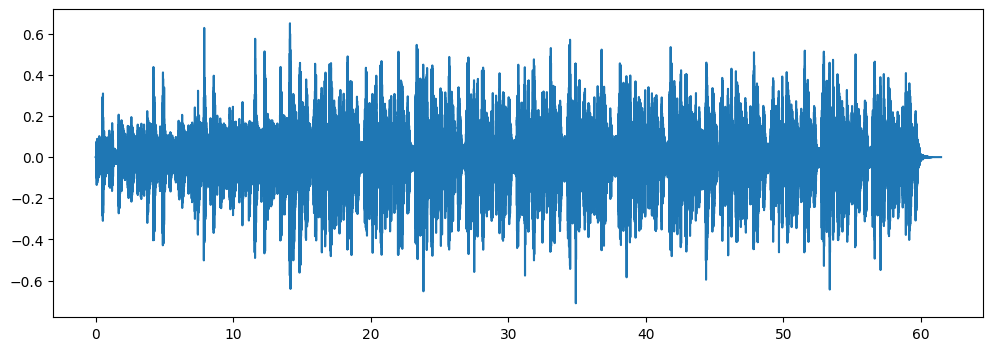

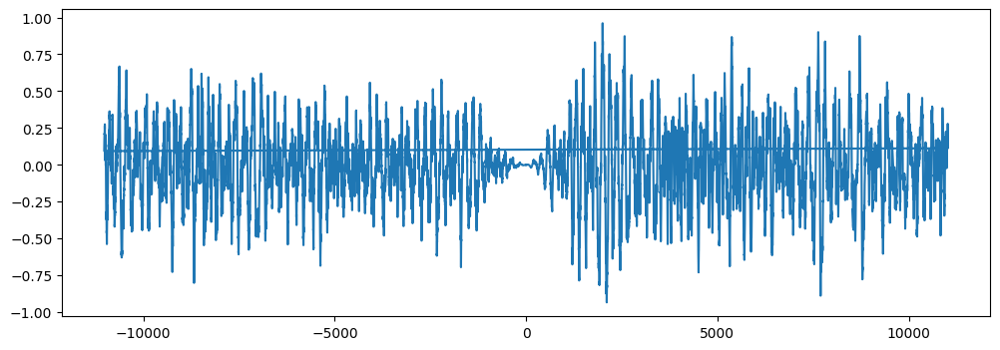

Original:


Random:


Reconstructed:


Original FFT


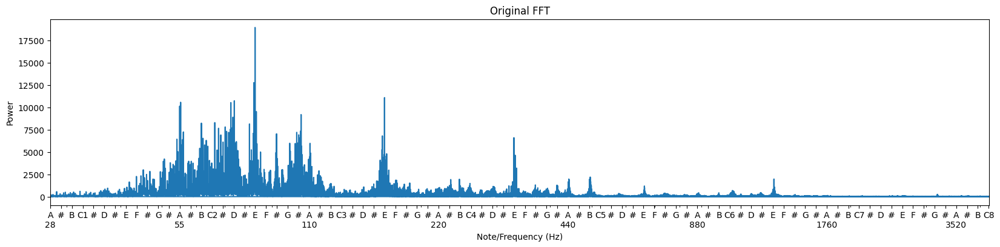

Reconstructed FFT


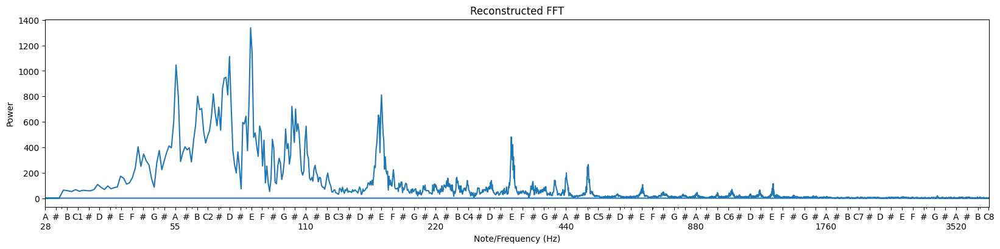

In [ ]:
from IPython.display import Audio

chun = 2**15
frequency_density = {}

for i in range(0,len(signal),chun):
  if i < -1:
    break
  mysignal = signal[i:i+chun]
  #print (len(mysignal))
  if len(mysignal) < chun:
    mysignal = np.pad(mysignal, (0, chun - len(mysignal)), 'constant')

  # Calculate FFT and sum magnitudes
  #print (len(mysignal))
  fast_fourier_transf = np.fft.fft(mysignal)
  frequencies = np.fft.fftfreq(len(fast_fourier_transf), 1/sr)
  magnitude = np.abs(fast_fourier_transf)
  total_sum = np.sum(magnitude)

  #plot_amp_frq (np.fft.fftfreq(len(fast_fourier_transf), 1/sr),magnitude,"Magnitudes")

  # Optional: Normalize the sum
  normalized_sum = total_sum / len(mysignal)

  #print("Total Sum of Frequencies:", total_sum)
  #print("Normalized Sum of Frequencies:", normalized_sum)

  # Calculate frequency density (sum of magnitudes for each frequency)
  #frequency_density = {}
  for i, freq in enumerate(frequencies):
      if freq >= 0:  # Consider only positive frequencies
          if freq < 30:
              frequency_density[freq] = 0
              continue
          else:
            if freq in frequency_density:
              frequency_density[freq] += magnitude[i]
            else:
              frequency_density[freq] = magnitude[i]

# Reconstruct audio signal
time = np.linspace(0, len(mysignal)/sr, len(mysignal))
reconstructed_signal = np.zeros_like(mysignal, dtype=float)
random_phases = np.random.rand(len(frequency_density)) * 2 * np.pi  # Generate random phases

i = 0

for freq, density in frequency_density.items():
    reconstructed_signal += density * np.sin(2 * np.pi * freq * time + random_phases[i]) # + i/1000) #random_phases[i])
    i += 1

# Normalize the signal
reconstructed_signal = reconstructed_signal / np.max(np.abs(reconstructed_signal))


reconstructed_signal = fade_in_out_audio (audio=reconstructed_signal, fade_duration=0.1)

print("Time:", type(time), time.shape, time[:10])  # Check type and shape of 'time'
print("Mysignal:", type(mysignal), mysignal.shape, mysignal[:10])  # Check type and shape of 'mysignal'

time_signal = np.linspace(0, len(signal)/sr, len(signal))
plt.figure(figsize=(12, 4))
plt.plot(time_signal, signal)
plt.show()

plt.figure(figsize=(12, 4))
plt.plot(np.fft.fftfreq(len(reconstructed_signal), 1/sr),reconstructed_signal)
plt.show()

print("Original:")
display(Audio(data=signal, rate=sr))
print("Random:")
display(Audio(data=signal[len(signal)//50:len(signal)//50+chun], rate=sr))
print("Reconstructed:")
display(Audio(data = low_band_pass_filter(np.tile(reconstructed_signal,1),sr,5000), rate=sr))
display(Audio(data = reconstructed_signal, rate=sr))

fast_fourier_transf = np.fft.fft(signal)
frequencies = np.fft.fftfreq(len(fast_fourier_transf), 1/sr)
magnitude = np.abs(fast_fourier_transf)

plot_amp_frq (frequencies,magnitude,"Original FFT")

fast_fourier_transf = np.fft.fft(reconstructed_signal)
frequencies = np.fft.fftfreq(len(fast_fourier_transf), 1/sr)
magnitude = np.abs(fast_fourier_transf)

plot_amp_frq (frequencies,magnitude,"Reconstructed FFT")
#

In [ ]:
from IPython.display import Audio
display(Audio(data=reconstructed_signal, rate=sr))